# Okcupid Match Prediction using PCA, K-Means and ANN Architecture
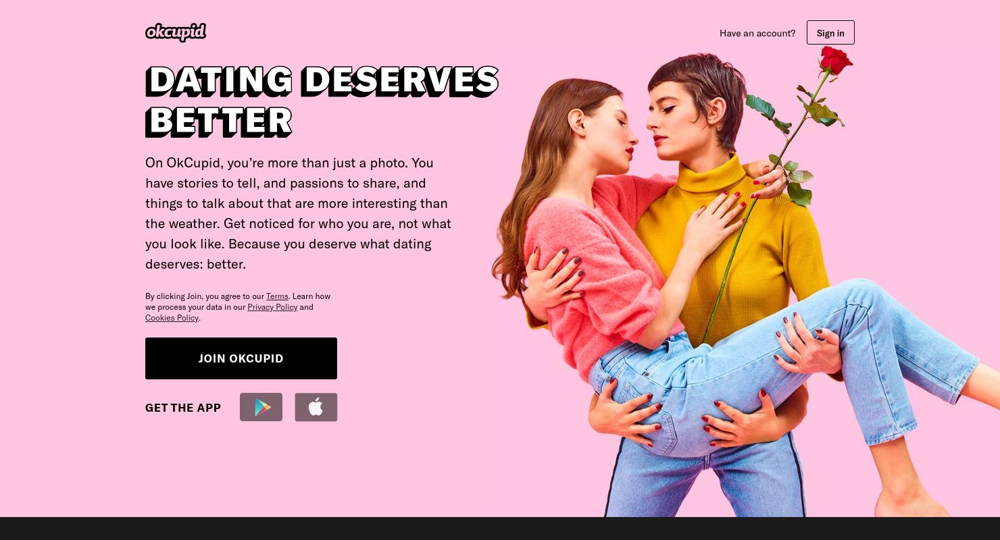

# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(15,8)})
plt.style.use('fivethirtyeight')

# Reading the Dataset

In [2]:
df = pd.read_csv("okcupid_profiles.csv")
df.head()

,age,status,sex,orientation,body_type,diet,drinks,drugs,education,ethnicity,...,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
0,22,single,m,straight,a little extra,strictly anything,socially,never,working on college/university,"asian, white",...,about me: i would love to think that i was so...,currently working as an international agent fo...,making people laugh. ranting about a good salt...,"the way i look. i am a six foot half asian, ha...","books: absurdistan, the republic, of mice and ...",food. water. cell phone. shelter.,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet! you are ti...
1,35,single,m,straight,average,mostly other,often,sometimes,working on space camp,white,...,i am a chef: this is what that means. 1. i am ...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories. my b...,NaN,NaN,i am very open and will share just about anyth...,NaN
2,38,available,m,straight,thin,anything,socially,NaN,graduated from masters program,NaN,...,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement conversation creation contemplation t...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ..."
3,23,single,m,straight,thin,vegetarian,socially,NaN,working on college/university,white,...,i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,"bataille, celine, beckett. . . lynch, jarmusch...",NaN,cats and german philosophy,NaN,NaN,you feel so inclined.
4,29,single,m,straight,athletic,NaN,socially,never,graduated from college/university,"asian, black, other",...,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at: http://bagsbrown....,i smile a lot and my inquisitive nature,"music: bands, rappers, musicians at the moment...",NaN,NaN,NaN,NaN,NaN


In [3]:
df.shape

(59946, 31)

In [4]:
df.columns

Index(['age', 'status', 'sex', 'orientation', 'body_type', 'diet', 'drinks',
       'drugs', 'education', 'ethnicity', 'height', 'income', 'job',
       'last_online', 'location', 'offspring', 'pets', 'religion', 'sign',
       'smokes', 'speaks', 'essay0', 'essay1', 'essay2', 'essay3', 'essay4',
       'essay5', 'essay6', 'essay7', 'essay8', 'essay9'],
      dtype='object')

In [5]:
df.describe()

,age,height,income
count,59946.000000,59943.000000,59946.000000
mean,32.340290,68.295281,20033.222534
std,9.452779,3.994803,97346.192104
min,18.000000,1.000000,-1.000000
25%,26.000000,66.000000,-1.000000
50%,30.000000,68.000000,-1.000000
75%,37.000000,71.000000,-1.000000
max,110.000000,95.000000,1000000.000000


# Data Cleaning

<AxesSubplot:>

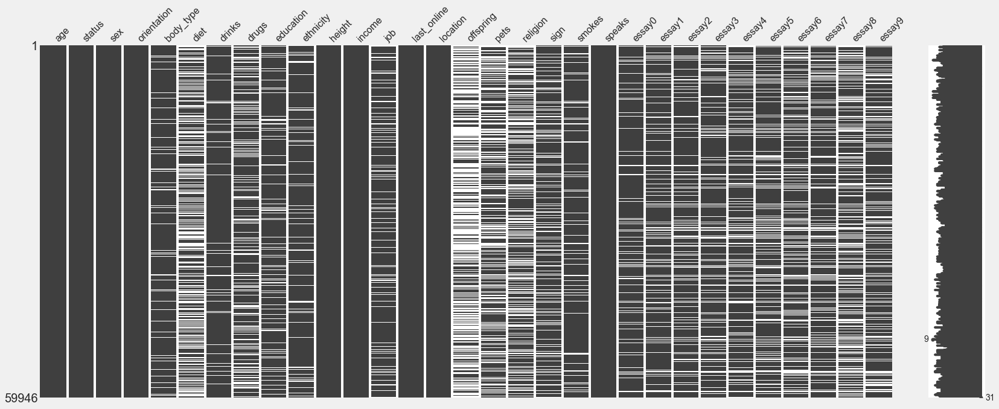

In [6]:
import missingno as m
m.matrix(df)

In [7]:
df.isnull().sum()

age                0
status             0
sex                0
orientation        0
body_type       5296
diet           24395
drinks          2985
drugs          14080
education       6628
ethnicity       5680
height             3
income             0
job             8198
last_online        0
location           0
offspring      35561
pets           19921
religion       20226
sign           11056
smokes          5512
speaks            50
essay0          5488
essay1          7572
essay2          9638
essay3         11476
essay4         10537
essay5         10850
essay6         13771
essay7         12451
essay8         19225
essay9         12603
dtype: int64

# Dropping useless columns

In [8]:
df = df.drop(columns = ['essay0', 'essay1', 'essay2', 'essay3', 'essay4','essay5', 'essay6', 'essay7', 'essay8', 'essay9'])

In [9]:
df = df.drop(columns = ['diet','drugs','offspring','pets','religion', 'sign','smokes','last_online'])

In [10]:
df.shape

(59946, 13)

<AxesSubplot:>

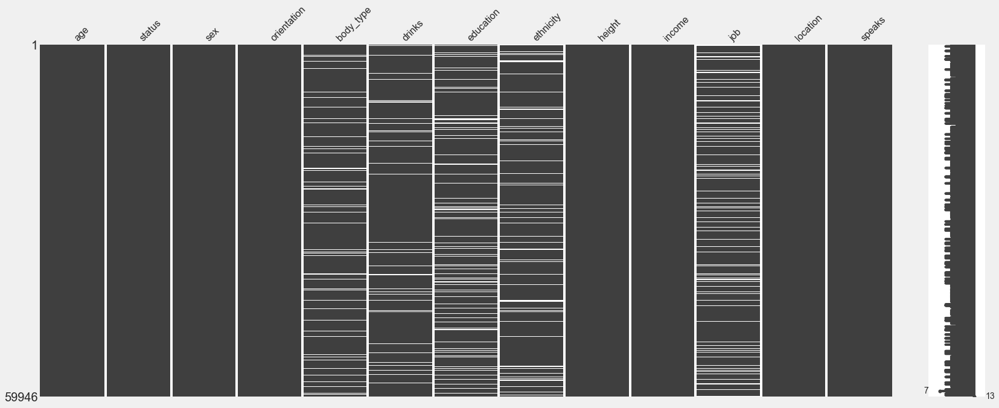

In [11]:
m.matrix(df)

## Replacing body_type column's nan with "rather not say" 

In [12]:
df.body_type.unique()

array(['a little extra', 'average', 'thin', 'athletic', 'fit', nan,
       'skinny', 'curvy', 'full figured', 'jacked', 'rather not say',
       'used up', 'overweight'], dtype=object)

In [13]:
df['body_type'] = df['body_type'].replace(np.nan,'rather not say')

In [14]:
df.body_type.value_counts()

average           14652
fit               12711
athletic          11819
rather not say     5494
thin               4711
curvy              3924
a little extra     2629
skinny             1777
full figured       1009
overweight          444
jacked              421
used up             355
Name: body_type, dtype: int64

<AxesSubplot:xlabel='body_type', ylabel='count'>

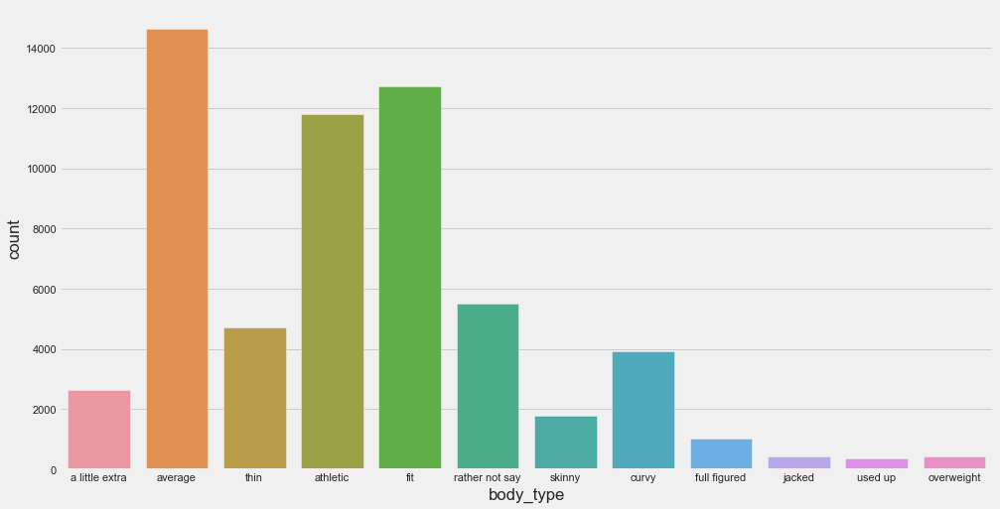

In [15]:
sns.countplot( x=df.body_type, data=df)

## Replacing drinks column's nan with rather not say

In [16]:
df.drinks.unique()

array(['socially', 'often', 'not at all', 'rarely', nan, 'very often',
       'desperately'], dtype=object)

In [17]:
df['drinks'] = df['drinks'].replace(np.nan,'rather not say')

In [18]:
df.drinks.value_counts()

socially          41780
rarely             5957
often              5164
not at all         3267
rather not say     2985
very often          471
desperately         322
Name: drinks, dtype: int64

<AxesSubplot:xlabel='drinks', ylabel='count'>

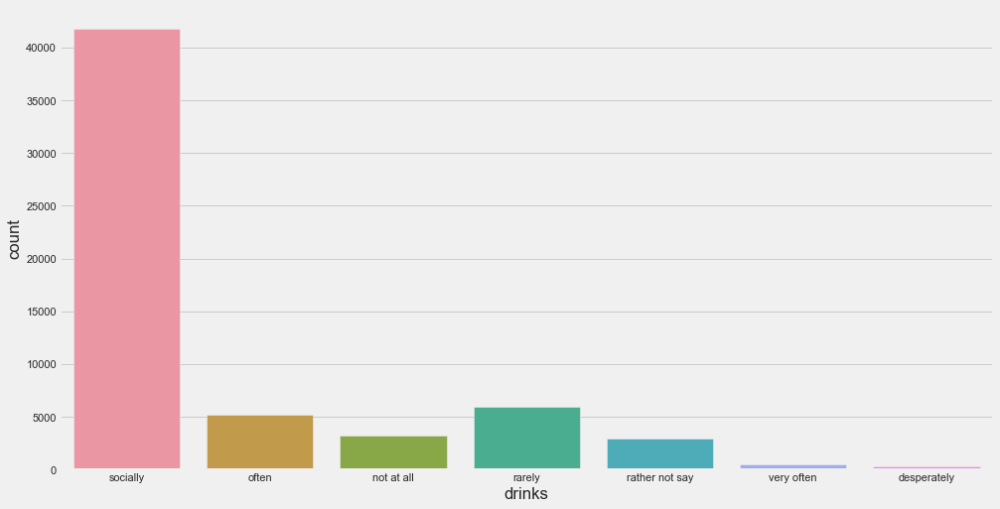

In [19]:
sns.countplot( x=df.drinks, data=df)

## Replacing education column's nan with rather not say

In [20]:
df.education.unique()

array(['working on college/university', 'working on space camp',
       'graduated from masters program',
       'graduated from college/university', 'working on two-year college',
       nan, 'graduated from high school', 'working on masters program',
       'graduated from space camp', 'college/university',
       'dropped out of space camp', 'graduated from ph.d program',
       'graduated from law school', 'working on ph.d program',
       'two-year college', 'graduated from two-year college',
       'working on med school', 'dropped out of college/university',
       'space camp', 'graduated from med school',
       'dropped out of high school', 'working on high school',
       'masters program', 'dropped out of ph.d program',
       'dropped out of two-year college', 'dropped out of med school',
       'high school', 'working on law school', 'law school',
       'dropped out of masters program', 'ph.d program',
       'dropped out of law school', 'med school'], dtype=object)

In [21]:
df['education'] = df['education'].replace(np.nan,'rather not say')

In [22]:
df.education.value_counts()

graduated from college/university    23959
graduated from masters program        8961
rather not say                        6628
working on college/university         5712
working on masters program            1683
graduated from two-year college       1531
graduated from high school            1428
graduated from ph.d program           1272
graduated from law school             1122
working on two-year college           1074
dropped out of college/university      995
working on ph.d program                983
college/university                     801
graduated from space camp              657
dropped out of space camp              523
graduated from med school              446
working on space camp                  445
working on law school                  269
two-year college                       222
working on med school                  212
dropped out of two-year college        191
dropped out of masters program         140
masters program                        136
dropped out

<AxesSubplot:xlabel='education', ylabel='count'>

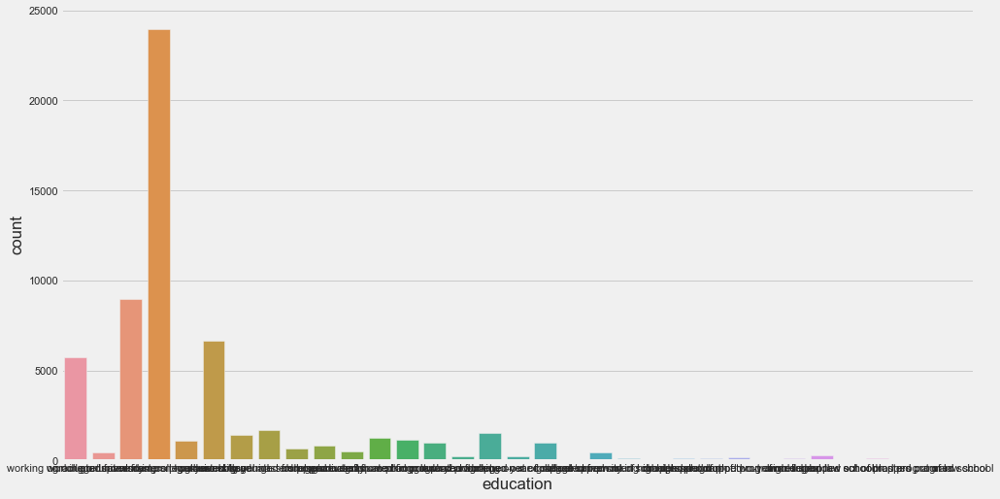

In [23]:
sns.countplot( x=df.education, data=df)

## Replacing ethnicity column's nan with others

In [24]:
df.ethnicity.unique()

array(['asian, white', 'white', nan, 'asian, black, other',
       'white, other', 'hispanic / latin, white', 'hispanic / latin',
       'pacific islander, white', 'asian', 'black, white',
       'pacific islander', 'asian, native american',
       'asian, pacific islander', 'black, native american, white',
       'middle eastern, other', 'native american, white', 'indian',
       'black', 'black, native american, hispanic / latin, other',
       'black, native american, hispanic / latin',
       'asian, black, pacific islander',
       'asian, middle eastern, black, native american, indian, pacific islander, hispanic / latin, white, other',
       'other', 'hispanic / latin, other', 'asian, black',
       'middle eastern, white', 'native american, white, other',
       'black, native american', 'black, white, other',
       'hispanic / latin, white, other', 'middle eastern', 'black, other',
       'native american, hispanic / latin, white', 'black, indian',
       'indian, white, othe

In [25]:
df['ethnicity'] = df['ethnicity'].replace(np.nan,'others')

In [26]:
df.ethnicity.value_counts()

white                                                                       32831
asian                                                                        6134
others                                                                       5680
hispanic / latin                                                             2823
black                                                                        2008
                                                                            ...  
middle eastern, black, indian, pacific islander, hispanic / latin, white        1
native american, indian, pacific islander, hispanic / latin                     1
asian, middle eastern, native american, hispanic / latin, white                 1
black, native american, pacific islander, hispanic / latin                      1
asian, black, native american, pacific islander, other                          1
Name: ethnicity, Length: 218, dtype: int64

## Replacing job column's nan with rather not say

In [27]:
df.job.unique()

array(['transportation', 'hospitality / travel', nan, 'student',
       'artistic / musical / writer', 'computer / hardware / software',
       'banking / financial / real estate', 'entertainment / media',
       'sales / marketing / biz dev', 'other', 'medicine / health',
       'science / tech / engineering', 'executive / management',
       'education / academia', 'clerical / administrative',
       'construction / craftsmanship', 'rather not say',
       'political / government', 'law / legal services', 'unemployed',
       'military', 'retired'], dtype=object)

In [28]:
df['job'] = df['job'].replace(np.nan,'rather not say')

In [29]:
df.job.value_counts()

rather not say                       8634
other                                7589
student                              4882
science / tech / engineering         4848
computer / hardware / software       4709
artistic / musical / writer          4439
sales / marketing / biz dev          4391
medicine / health                    3680
education / academia                 3513
executive / management               2373
banking / financial / real estate    2266
entertainment / media                2250
law / legal services                 1381
hospitality / travel                 1364
construction / craftsmanship         1021
clerical / administrative             805
political / government                708
transportation                        366
unemployed                            273
retired                               250
military                              204
Name: job, dtype: int64

<AxesSubplot:xlabel='job', ylabel='count'>

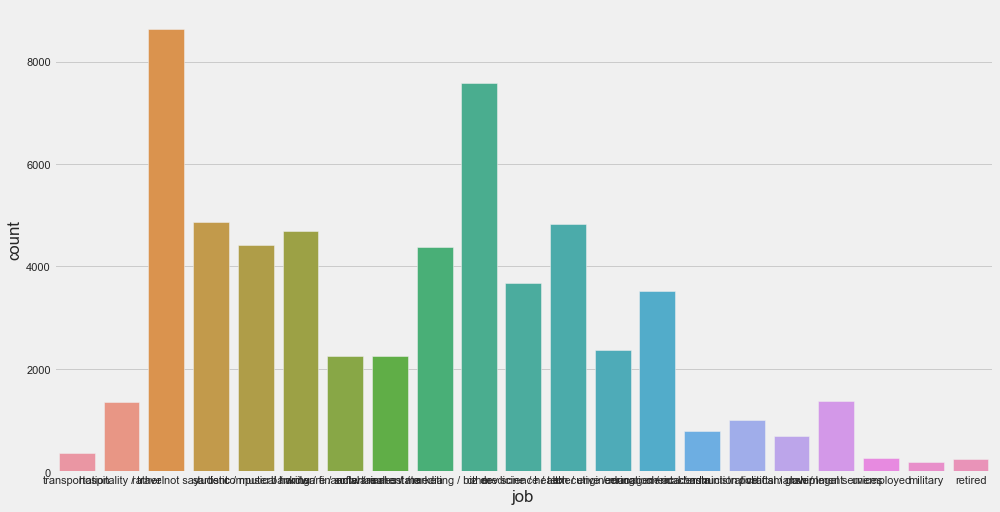

In [30]:
sns.countplot( x=df.job, data=df)

<AxesSubplot:>

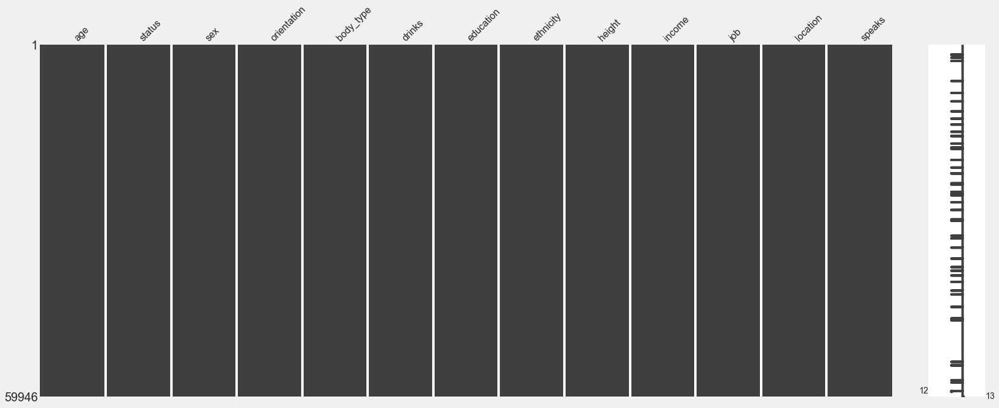

In [31]:
m.matrix(df)

## Data is now cleaned

# Basic Data Analysis

In [32]:
dff = df.copy()

In [33]:
dff.shape

(59946, 13)

In [34]:
import plotly.express as px

fig = px.violin(dff, y="age", color='status', points='all', box=True, title="Age Plot")
fig.show()

In [35]:
fig = px.histogram(dff, x="status", color="sex", title= 'Status with Sex')
fig.show()

In [36]:
fig = px.histogram(dff, color="orientation", x='body_type', title = "Orientation with Body Type")
fig.show()

In [37]:
df.head()

,age,status,sex,orientation,body_type,drinks,education,ethnicity,height,income,job,location,speaks
0,22,single,m,straight,a little extra,socially,working on college/university,"asian, white",75.0,-1,transportation,"south san francisco, california",english
1,35,single,m,straight,average,often,working on space camp,white,70.0,80000,hospitality / travel,"oakland, california","english (fluently), spanish (poorly), french (..."
2,38,available,m,straight,thin,socially,graduated from masters program,others,68.0,-1,rather not say,"san francisco, california","english, french, c++"
3,23,single,m,straight,thin,socially,working on college/university,white,71.0,20000,student,"berkeley, california","english, german (poorly)"
4,29,single,m,straight,athletic,socially,graduated from college/university,"asian, black, other",66.0,-1,artistic / musical / writer,"san francisco, california",english


## Replacing -1 values in income column with 0

In [38]:
df.income.unique()

array([     -1,   80000,   20000,   40000,   30000,   50000,   60000,
       1000000,  150000,  100000,  500000,   70000,  250000], dtype=int64)

In [39]:
df['income'] = df['income'].replace(-1,0)

In [40]:
df.income.value_counts()

0          48442
20000       2952
100000      1621
80000       1111
30000       1048
40000       1005
50000        975
60000        736
70000        707
150000       631
1000000      521
250000       149
500000        48
Name: income, dtype: int64

<AxesSubplot:xlabel='income', ylabel='count'>

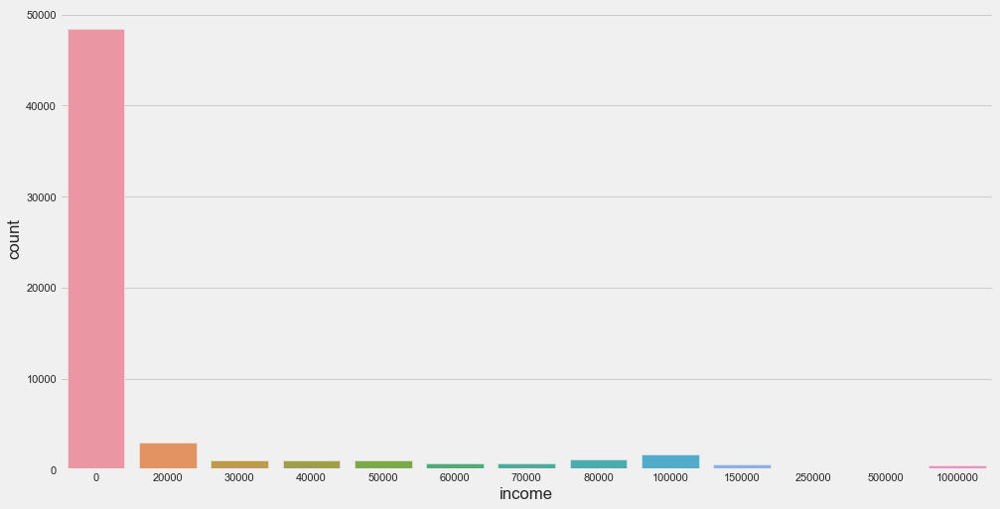

In [41]:
sns.countplot( x=df.income, data=df)

## In ethnicity column we are considering only the first word and removing others

In [42]:
df.ethnicity.unique()

array(['asian, white', 'white', 'others', 'asian, black, other',
       'white, other', 'hispanic / latin, white', 'hispanic / latin',
       'pacific islander, white', 'asian', 'black, white',
       'pacific islander', 'asian, native american',
       'asian, pacific islander', 'black, native american, white',
       'middle eastern, other', 'native american, white', 'indian',
       'black', 'black, native american, hispanic / latin, other',
       'black, native american, hispanic / latin',
       'asian, black, pacific islander',
       'asian, middle eastern, black, native american, indian, pacific islander, hispanic / latin, white, other',
       'other', 'hispanic / latin, other', 'asian, black',
       'middle eastern, white', 'native american, white, other',
       'black, native american', 'black, white, other',
       'hispanic / latin, white, other', 'middle eastern', 'black, other',
       'native american, hispanic / latin, white', 'black, indian',
       'indian, white,

In [43]:
df['ethnicity'] = df['ethnicity'].apply(lambda x: x.split()[0])

In [44]:
df['ethnicity'].unique()

array(['asian,', 'white', 'others', 'white,', 'hispanic', 'pacific',
       'asian', 'black,', 'middle', 'native', 'indian', 'black', 'other',
       'indian,'], dtype=object)

In [45]:
df['ethnicity'] = df['ethnicity'].replace(['white,','black,','indian,','asian,'],['white','black','indian','asian'])

In [46]:
df['ethnicity'].value_counts()

white       33472
asian        8205
others       5680
hispanic     4379
black        3071
other        1706
indian       1196
middle        811
pacific       717
native        709
Name: ethnicity, dtype: int64

<AxesSubplot:xlabel='ethnicity', ylabel='count'>

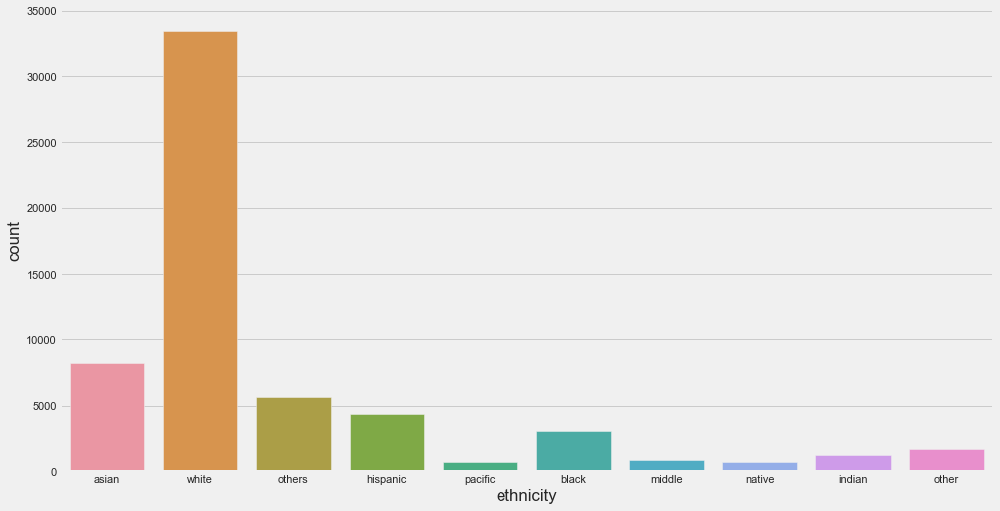

In [47]:
sns.countplot( x=df.ethnicity, data=df)

## In speaks column we are considering only the first word and removing others

In [48]:
df['speaks'] = df['speaks'].apply(lambda x: str(x).split()[0])

In [49]:
df['speaks'].value_counts()

english       51583
english,       8309
nan              50
french            2
portuguese        1
afrikaans,        1
Name: speaks, dtype: int64

### Since 51583 out of 59000 prople speaks english so it is a useless column and we can drop it

In [50]:
df = df.drop(columns = ['speaks'])

In [51]:
df.head()

,age,status,sex,orientation,body_type,drinks,education,ethnicity,height,income,job,location
0,22,single,m,straight,a little extra,socially,working on college/university,asian,75.0,0,transportation,"south san francisco, california"
1,35,single,m,straight,average,often,working on space camp,white,70.0,80000,hospitality / travel,"oakland, california"
2,38,available,m,straight,thin,socially,graduated from masters program,others,68.0,0,rather not say,"san francisco, california"
3,23,single,m,straight,thin,socially,working on college/university,white,71.0,20000,student,"berkeley, california"
4,29,single,m,straight,athletic,socially,graduated from college/university,asian,66.0,0,artistic / musical / writer,"san francisco, california"


# Labelling the Categorical Data

In [52]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['status'] = le.fit_transform(df['status'])
df['sex'] = le.fit_transform(df['sex'])
df['orientation'] = le.fit_transform(df['orientation'])
df['body_type'] = le.fit_transform(df['body_type'])
df['drinks'] = le.fit_transform(df['drinks'])
df['education'] = le.fit_transform(df['education'])
df['ethnicity'] = le.fit_transform(df['ethnicity'])
df['job'] = le.fit_transform(df['job'])
df['location'] = le.fit_transform(df['location'])

# Dropping the empty columns if exists

In [53]:
df = df.dropna()

# Final Dataset

In [54]:
df.head()

,age,status,sex,orientation,body_type,drinks,education,ethnicity,height,income,job,location
0,22,3,1,2,0,5,25,0,75.0,0,19,175
1,35,3,1,2,2,2,31,9,70.0,80000,8,118
2,38,0,1,2,10,5,12,7,68.0,0,14,155
3,23,3,1,2,10,5,25,9,71.0,20000,18,16
4,29,3,1,2,1,5,9,0,66.0,0,0,155


In [55]:
df.shape

(59943, 12)

# Heatmap

<AxesSubplot:>

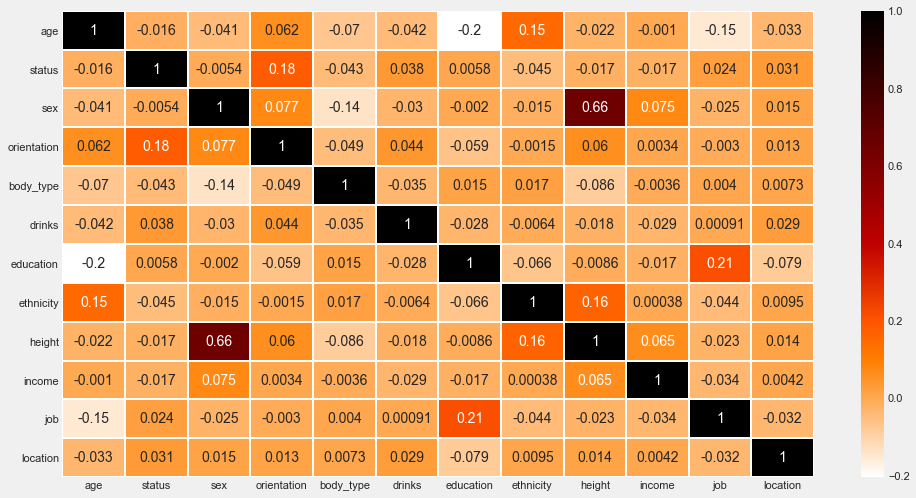

In [56]:
sns.heatmap(df.corr(), annot= True, linewidth=1, cmap='gist_heat_r')

# Applying Principle Component Analysis

In [57]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 3)
new_df = pca.fit_transform(df)


# Making it into 3 columns for Cluster Plotting

In [58]:
new_df

array([[-2.00350332e+04, -4.78544584e+01, -1.52043981e+01],
       [ 5.99649667e+04,  9.42766091e+00, -3.17015138e+00],
       [-2.00350332e+04, -2.79348637e+01,  5.27331143e+00],
       ...,
       [ 7.99649668e+04, -4.77245371e+01,  1.03221873e+01],
       [-2.00350332e+04, -2.78577166e+01, -9.10306387e+00],
       [-2.00350332e+04, -2.79427954e+01,  7.17632371e+00]])

In [59]:
pca_df = pd.DataFrame(new_df, columns = ['Column_A','Column_B','Column_C'])

# PCA dataset

In [60]:
pca_df.head()

,Column_A,Column_B,Column_C
0,-20035.033194,-47.854458,-15.204398
1,59964.966686,9.427661,-3.170151
2,-20035.033229,-27.934864,5.273311
3,-35.033540,111.167488,-13.857604
4,-20035.033200,-28.075727,0.369103


# Elbow Method

In [61]:
from sklearn.cluster import KMeans
X3 = new_df
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n, random_state= 111) )
    algorithm.fit(X3)
    inertia.append(algorithm.inertia_)

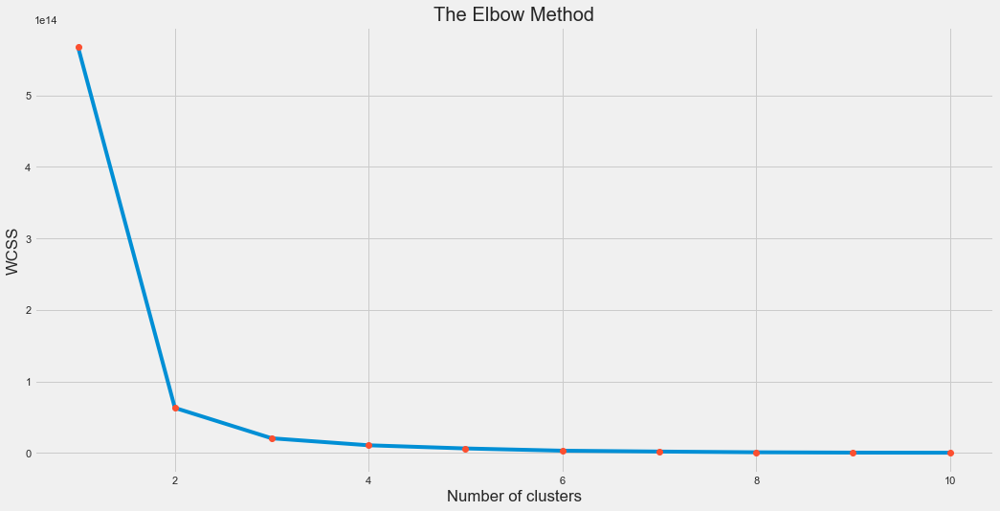

In [62]:
wcss = []
plt.figure(figsize = (16, 8))
for i in range(1, 11):
    Kmeans = KMeans(n_clusters = i, random_state = 42)
    Kmeans.fit(X3)
    wcss.append(Kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.plot(np.arange(1 , 11) , wcss , 'o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Making Cluster Number 3

In [63]:
algorithm = (KMeans(n_clusters = 3 , random_state= 111))
algorithm.fit(X3)
clusters = algorithm.labels_
centroids3 = algorithm.cluster_centers_

In [64]:
clusters

array([0, 2, 0, ..., 2, 0, 0])

# Adding the label into pca dataset

In [65]:
pca_df['clusters'] =  clusters

In [66]:
pca_df['clusters'].value_counts()

0    53444
2     5978
1      521
Name: clusters, dtype: int64

# PCA dataset with labels

In [67]:
pca_df.head()

,Column_A,Column_B,Column_C,clusters
0,-20035.033194,-47.854458,-15.204398,0
1,59964.966686,9.427661,-3.170151,2
2,-20035.033229,-27.934864,5.273311,0
3,-35.033540,111.167488,-13.857604,0
4,-20035.033200,-28.075727,0.369103,0


# Cluster Plot

In [69]:
import plotly.express as px
fig = px.scatter_3d(pca_df, x="Column_A", y='Column_B', z='Column_C', color = 'clusters')
fig.show()

# Adding labels into Main dataset

In [70]:
df['clusters'] =  clusters

# Main Dataset with Labels

In [71]:
df.head()

,age,status,sex,orientation,body_type,drinks,education,ethnicity,height,income,job,location,clusters
0,22,3,1,2,0,5,25,0,75.0,0,19,175,0
1,35,3,1,2,2,2,31,9,70.0,80000,8,118,2
2,38,0,1,2,10,5,12,7,68.0,0,14,155,0
3,23,3,1,2,10,5,25,9,71.0,20000,18,16,0
4,29,3,1,2,1,5,9,0,66.0,0,0,155,0


# Renaming the label like
  ### 0 = Not Interested 
   ### 1 = Little Interested
   ### 2 = Interested

In [72]:
df['clusters'] = df['clusters'].replace([0],'Not Interested')
df['clusters'] = df['clusters'].replace([1],'Little Interested')
df['clusters'] = df['clusters'].replace([2],'Interested')

In [73]:
df.head()

,age,status,sex,orientation,body_type,drinks,education,ethnicity,height,income,job,location,clusters
0,22,3,1,2,0,5,25,0,75.0,0,19,175,Not Interested
1,35,3,1,2,2,2,31,9,70.0,80000,8,118,Interested
2,38,0,1,2,10,5,12,7,68.0,0,14,155,Not Interested
3,23,3,1,2,10,5,25,9,71.0,20000,18,16,Not Interested
4,29,3,1,2,1,5,9,0,66.0,0,0,155,Not Interested


# Interest Plot

<AxesSubplot:xlabel='clusters', ylabel='count'>

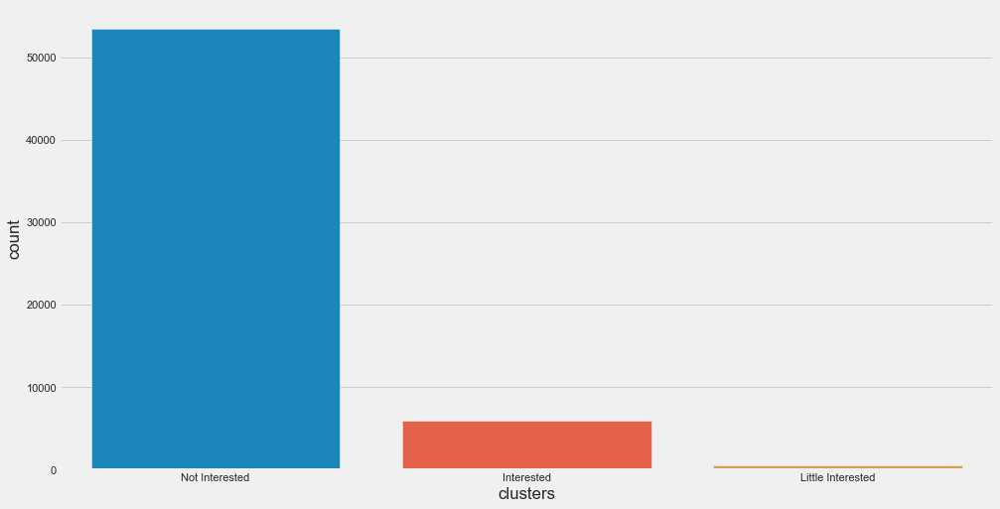

In [74]:
sns.countplot( x=df.clusters, data=df)

# X and y Split

In [75]:
pca_df.columns

Index(['Column_A', 'Column_B', 'Column_C', 'clusters'], dtype='object')

In [76]:
X = pca_df[['Column_A', 'Column_B', 'Column_C']]
y = pca_df['clusters']

# Making Dummy Variables for y dataset

In [77]:
y = pd.get_dummies(y)

In [78]:
y.head()

,0,1,2
0,1,0,0
1,0,0,1
2,1,0,0
3,1,0,0
4,1,0,0


# Train Test Split

In [79]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [80]:
X_train.shape, y_train.shape

((47954, 3), (47954, 3))

In [81]:
X_test.shape,y_test.shape

((11989, 3), (11989, 3))

# Building the ANN Model with 5 Hidden Layers

In [82]:
import tensorflow as tf

In [83]:
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=20, activation='relu'))
ann.add(tf.keras.layers.Dense(units=15, activation='relu'))
ann.add(tf.keras.layers.Dense(units=35, activation='relu'))
ann.add(tf.keras.layers.Dense(units=50, activation='relu'))
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))
ann.add(tf.keras.layers.Dense(units=3, activation='sigmoid'))

# Compiling with ADAM Optimizer and Binary Crossentropy Loss Function

In [84]:
ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Fitting the Model into Dataset

In [85]:
history = ann.fit(X_train, y_train , validation_data=(X_test,y_test), batch_size = 32, epochs = 30)

Epoch 1/30
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor

# Accuracy vs Validation Accuracy Plot

In [86]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(y=history.history['accuracy'], name='Accuracy',
                         line=dict(color='royalblue', width=5)))
fig.add_trace(go.Scatter(y=history.history['val_accuracy'], name = 'Validation Accuracy',
                         line=dict(color='firebrick', width=5)))

# Loss vs Validation Loss Plot

In [87]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(y=history.history['loss'], name='Loss',
                         line=dict(color='royalblue', width=5)))
fig.add_trace(go.Scatter(y=history.history['val_loss'], name = 'Validation Loss',
                         line=dict(color='firebrick', width=5)))

# Predict on Test Set

In [88]:
y_pred = ann.predict(X_test)
y_pred = (y_pred > 0.5)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


In [89]:
y_pred = np.where(y_pred == 'False',0, y_pred)

C:\Users\KIIT\Anaconda3\envs\python 36 with tensorflow\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [90]:
y_test = y_test.values

# Predicted Value vs Actual Value

In [91]:
print(np.concatenate((y_pred.reshape(len(y_pred),3), y_test.reshape(len(y_test),3)),1))

[[1 0 0 1 0 0]
 [0 0 1 0 0 1]
 [1 0 0 1 0 0]
 ...
 [1 0 0 1 0 0]
 [1 0 0 1 0 0]
 [1 0 0 1 0 0]]


# Model Accuracy

In [92]:
from sklearn.metrics import accuracy_score
print("Accuracy : ",accuracy_score(y_test, y_pred))

Accuracy :  0.9608780548836433


# Classification Report

In [93]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98     10705
           1       0.00      0.00      0.00        91
           2       0.70      1.00      0.83      1193

   micro avg       0.96      0.96      0.96     11989
   macro avg       0.57      0.65      0.60     11989
weighted avg       0.96      0.96      0.96     11989
 samples avg       0.96      0.96      0.96     11989



C:\Users\KIIT\Anaconda3\envs\python 36 with tensorflow\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



# This Model Can Predict a Match with an Accuracy of 96%